In [1]:
%matplotlib inline
from casatasks import tclean, ft, clearcal, uvsub, split
from casatools import ms, table, msmetadata
from spectral_cube import SpectralCube
import numpy as np
from astropy import units as u, visualization
from astropy.visualization import simple_norm
import pylab as pl
visualization.quantity_support()
ms = ms()
msmd = msmetadata()
tb = table()

In [2]:
cd /orange/adamginsburg/ALMA_IMF/2017.1.01355.L/

/orange/adamginsburg/ALMA_IMF/2017.1.01355.L


In [3]:
original_ms = "W51-E_B3_uid___A001_X1296_X10b_continuum_merged_12M_selfcal.ms"
experiment_ms_1 = "experiment_w51eb3_1.ms"
experiment_ms_2 = "experiment_w51eb3_2.ms"

In [ ]:
for spw in spws:


In [4]:
spw=12
ms.open(experiment_ms_1); ms.selectinit(spw); data_check = ms.getdata(['data', 'corrected_data', 'model_data'], ifraxis=True); ms.close()

True

In [8]:
msmd.open(experiment_ms_1);
spws = (msmd.spwsforfield('W51-E'))
freqs = {spw: msmd.chanfreqs(spw) for spw in spws}
msmd.close()

True

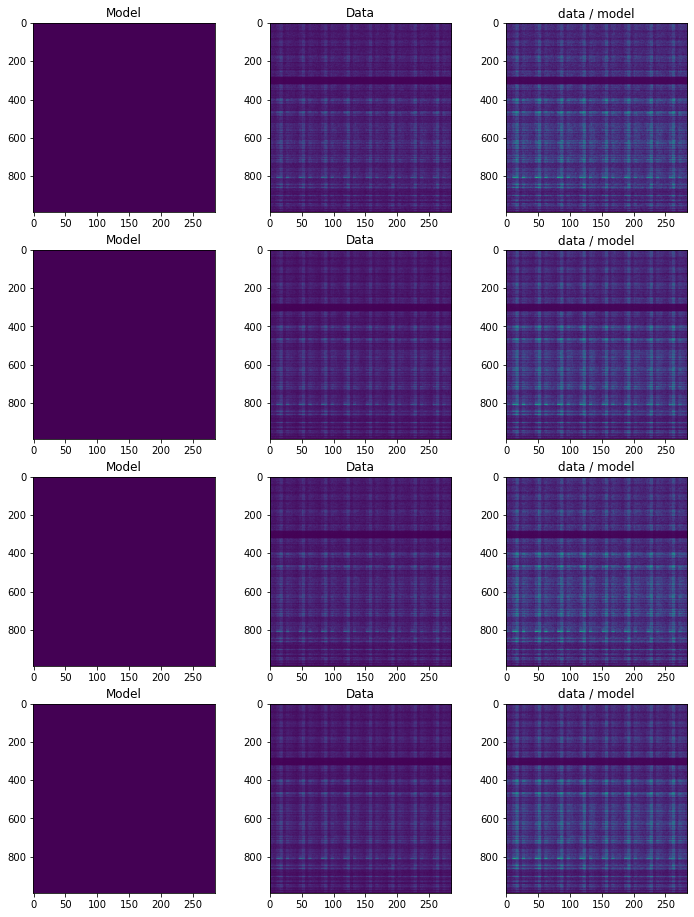

In [7]:
pl.figure(figsize=(12,16))
pl.subplot(4,3,1).imshow(np.abs(data_check['model_data'][0,0])); pl.title("Model"); pl.gca().set_aspect(0.3)
pl.subplot(4,3,2).imshow(np.abs(data_check['data'][0,0])); pl.title("Data"); pl.gca().set_aspect(0.3)
pl.subplot(4,3,3).imshow(np.abs(data_check['data'][0,0]/data_check['model_data'][0,0]), vmin=0, vmax=2); pl.title("data / model"); pl.gca().set_aspect(0.3)
pl.subplot(4,3,4).imshow(np.abs(data_check['model_data'][0,1])); pl.title("Model"); pl.gca().set_aspect(0.3)
pl.subplot(4,3,5).imshow(np.abs(data_check['data'][0,1])); pl.title("Data"); pl.gca().set_aspect(0.3)
pl.subplot(4,3,6).imshow(np.abs(data_check['data'][0,1]/data_check['model_data'][0,1]), vmin=0, vmax=2); pl.title("data / model"); pl.gca().set_aspect(0.3)
pl.subplot(4,3,7).imshow(np.abs(data_check['model_data'][1,0])); pl.title("Model"); pl.gca().set_aspect(0.3)
pl.subplot(4,3,8).imshow(np.abs(data_check['data'][1,0])); pl.title("Data"); pl.gca().set_aspect(0.3)
pl.subplot(4,3,9).imshow(np.abs(data_check['data'][1,0]/data_check['model_data'][0,0]), vmin=0, vmax=2); pl.title("data / model"); pl.gca().set_aspect(0.3)
pl.subplot(4,3,10).imshow(np.abs(data_check['model_data'][1,1])); pl.title("Model"); pl.gca().set_aspect(0.3)
pl.subplot(4,3,11).imshow(np.abs(data_check['data'][1,1])); pl.title("Data"); pl.gca().set_aspect(0.3)
pl.subplot(4,3,12).imshow(np.abs(data_check['data'][1,1]/data_check['model_data'][0,1]), vmin=0, vmax=2); pl.title("data / model"); pl.gca().set_aspect(0.3)

/orange/adamginsburg/miniconda3/envs/casa61_py36/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


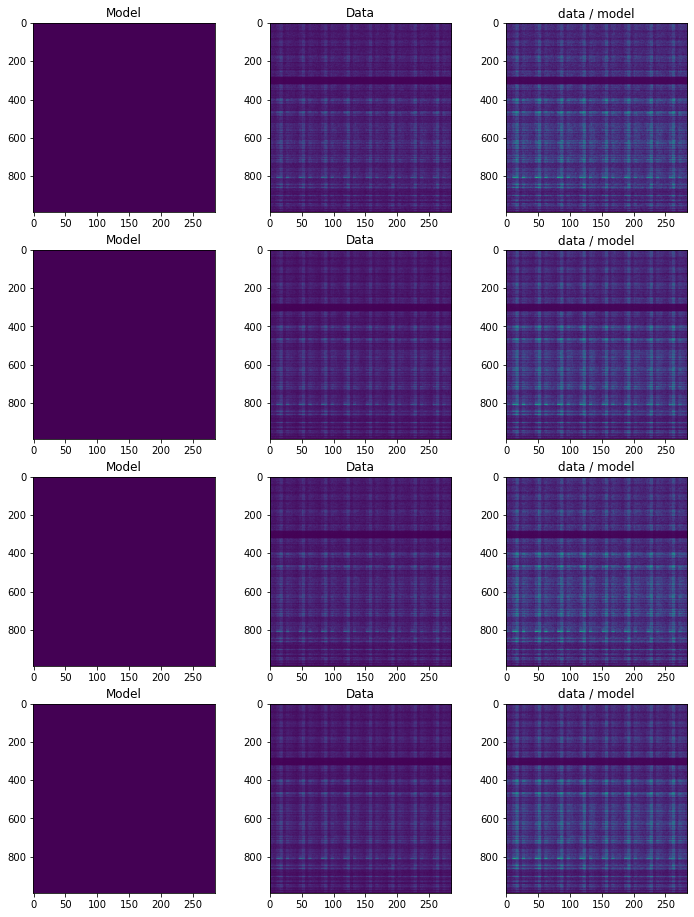

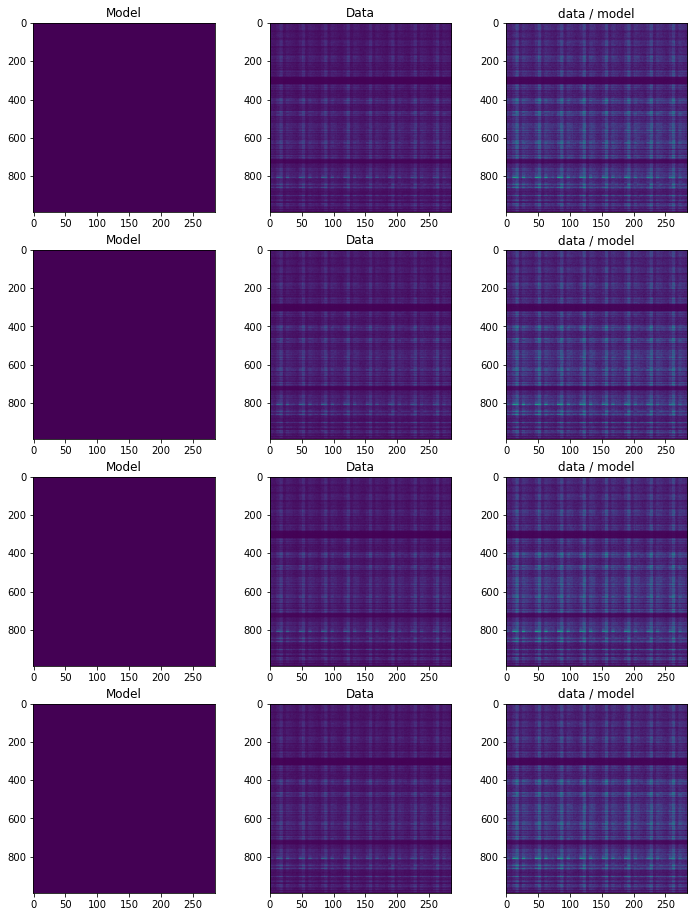

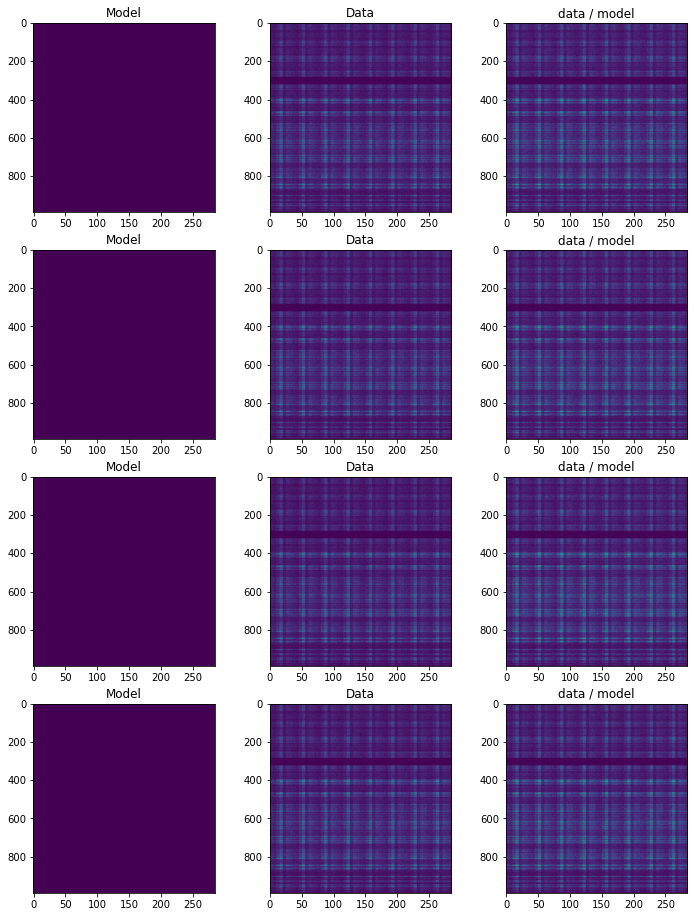

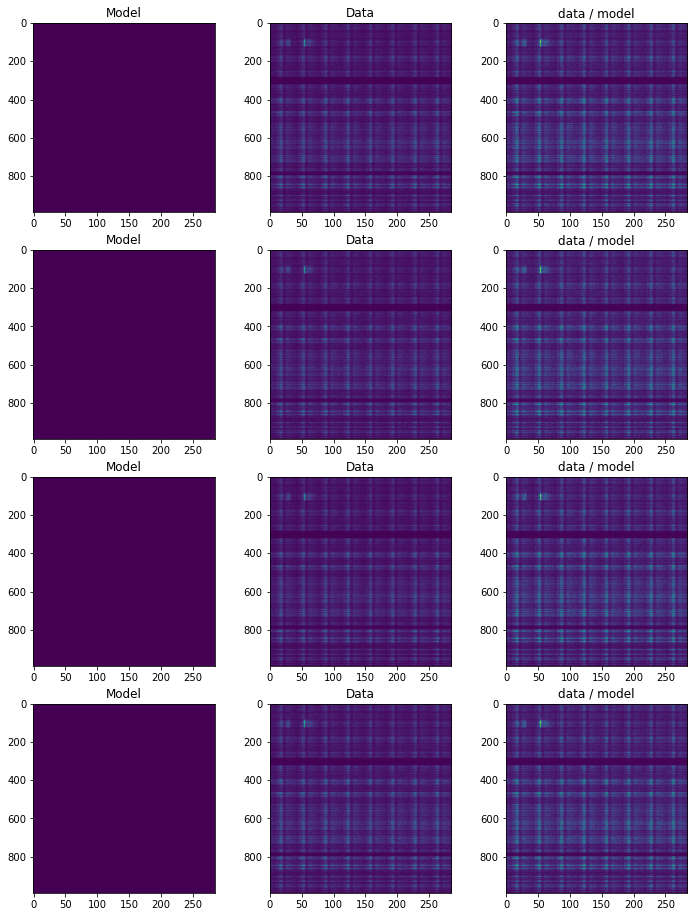

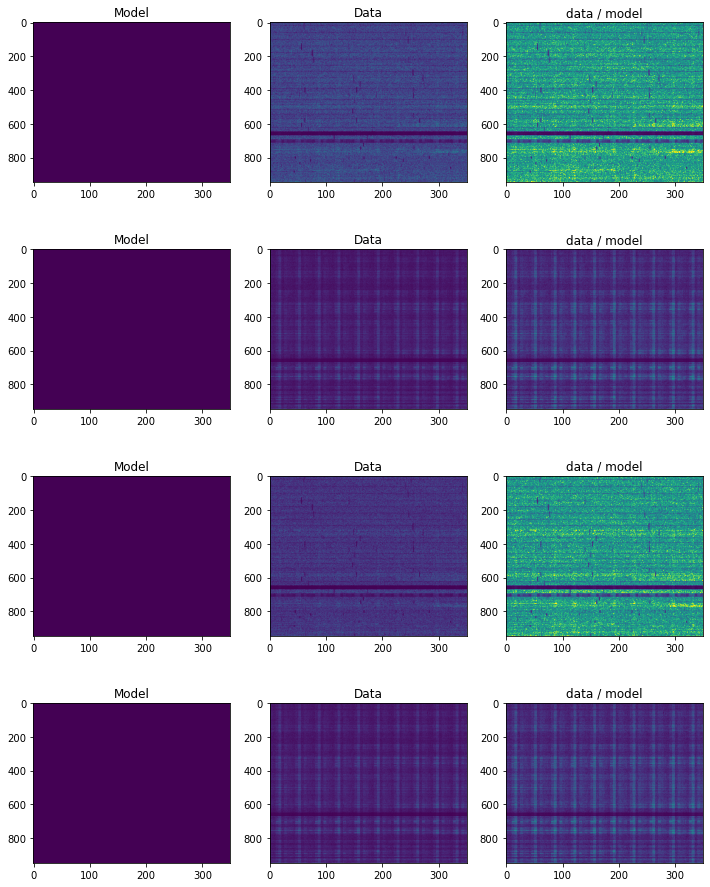

...

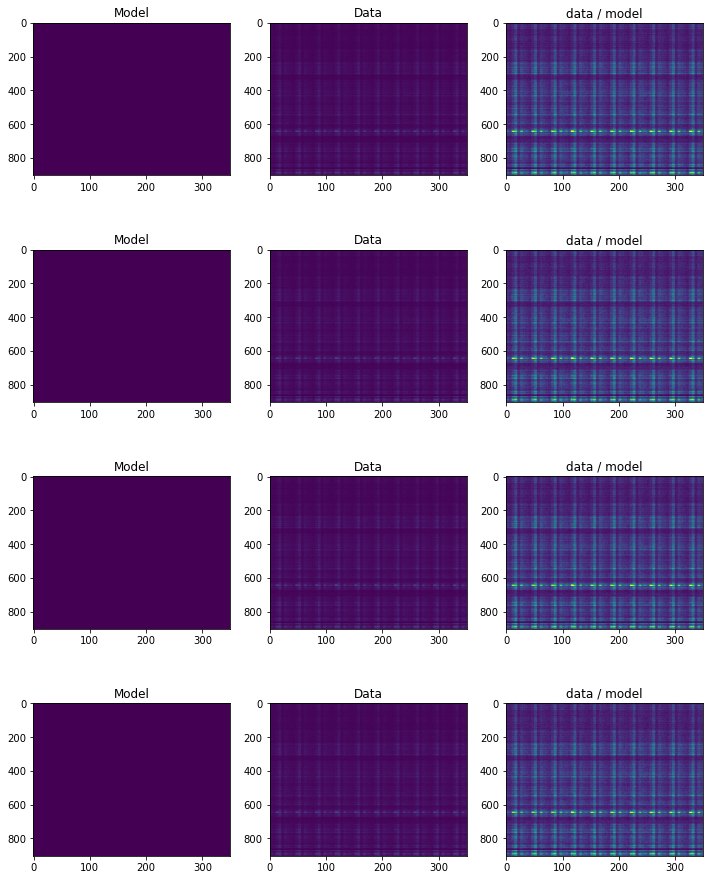

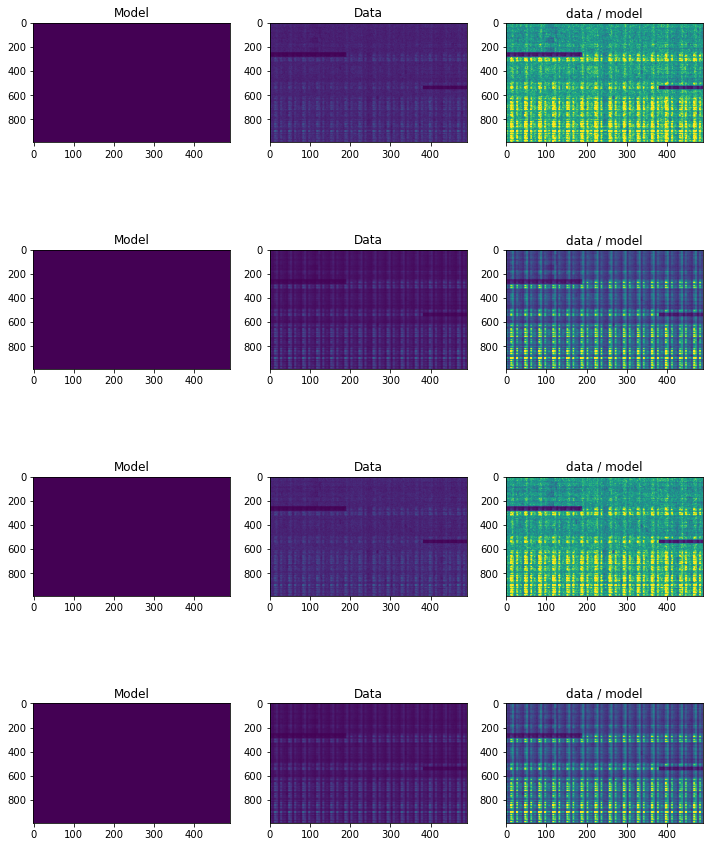

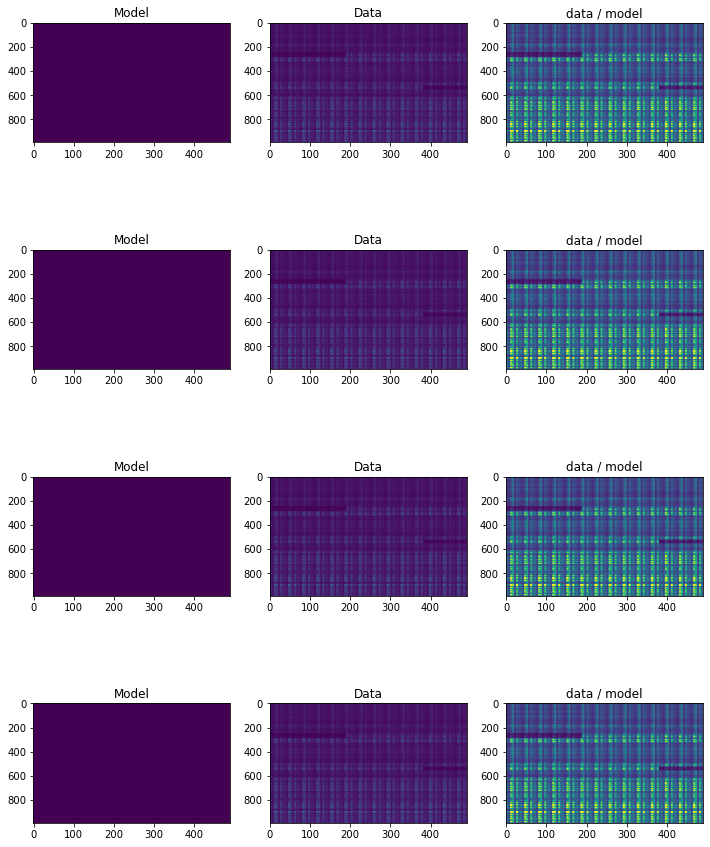

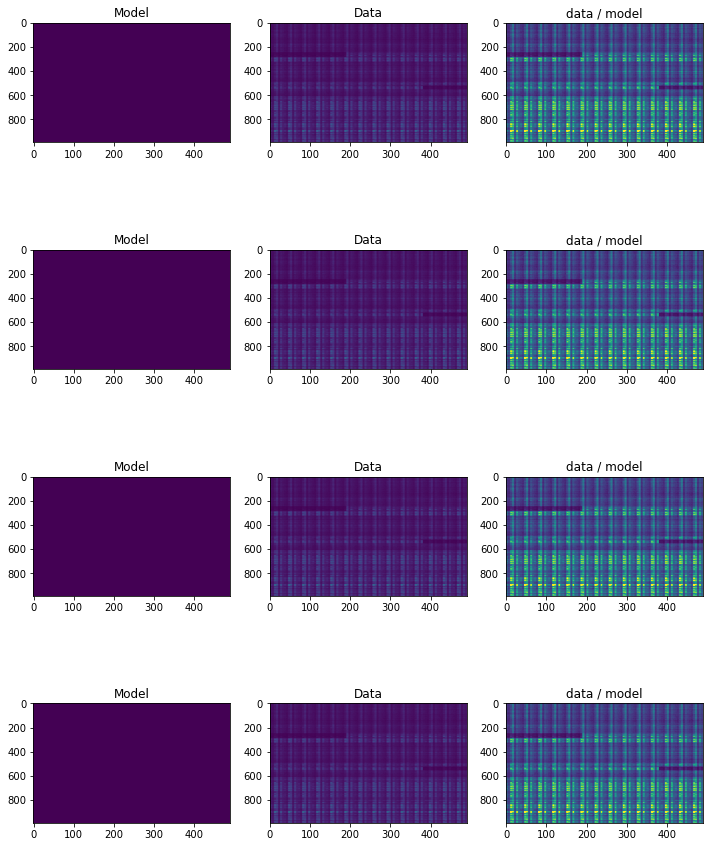

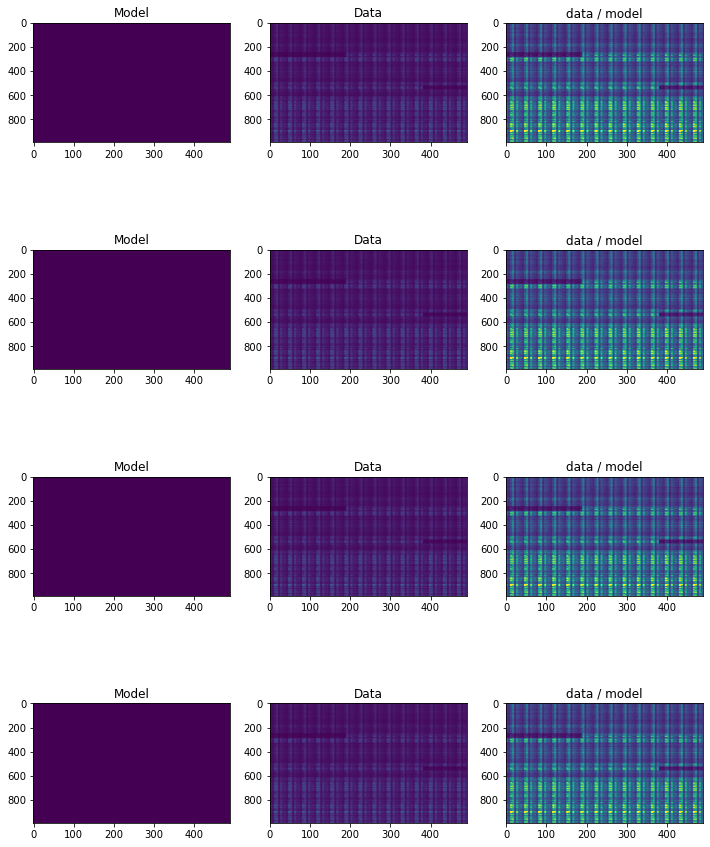

In [9]:
for spw in spws:
    ms.open(experiment_ms_1); ms.selectinit(spw); data_check = ms.getdata(['data', 'corrected_data', 'model_data'], ifraxis=True); ms.close()
    pl.figure(figsize=(12,16))
    pl.subplot(4,3,1).imshow(np.abs(data_check['model_data'][0,0])); pl.title("Model"); pl.gca().set_aspect(0.3)
    pl.subplot(4,3,2).imshow(np.abs(data_check['data'][0,0])); pl.title("Data"); pl.gca().set_aspect(0.3)
    pl.subplot(4,3,3).imshow(np.abs(data_check['data'][0,0]/data_check['model_data'][0,0]), vmin=0, vmax=2); pl.title("data / model"); pl.gca().set_aspect(0.3)
    pl.subplot(4,3,4).imshow(np.abs(data_check['model_data'][0,1])); pl.title("Model"); pl.gca().set_aspect(0.3)
    pl.subplot(4,3,5).imshow(np.abs(data_check['data'][0,1])); pl.title("Data"); pl.gca().set_aspect(0.3)
    pl.subplot(4,3,6).imshow(np.abs(data_check['data'][0,1]/data_check['model_data'][0,1]), vmin=0, vmax=2); pl.title("data / model"); pl.gca().set_aspect(0.3)
    pl.subplot(4,3,7).imshow(np.abs(data_check['model_data'][1,0])); pl.title("Model"); pl.gca().set_aspect(0.3)
    pl.subplot(4,3,8).imshow(np.abs(data_check['data'][1,0])); pl.title("Data"); pl.gca().set_aspect(0.3)
    pl.subplot(4,3,9).imshow(np.abs(data_check['data'][1,0]/data_check['model_data'][0,0]), vmin=0, vmax=2); pl.title("data / model"); pl.gca().set_aspect(0.3)
    pl.subplot(4,3,10).imshow(np.abs(data_check['model_data'][1,1])); pl.title("Model"); pl.gca().set_aspect(0.3)
    pl.subplot(4,3,11).imshow(np.abs(data_check['data'][1,1])); pl.title("Data"); pl.gca().set_aspect(0.3)
    pl.subplot(4,3,12).imshow(np.abs(data_check['data'][1,1]/data_check['model_data'][0,1]), vmin=0, vmax=2); pl.title("data / model"); pl.gca().set_aspect(0.3)

In [22]:
def plot_model(data):
    """
    plot baseline-vs-time images for visibility data
    """
    pl.figure(figsize=(16,16))
    ind = 1
    for pol in (0,1):
        for spw in (0,1):            
            mod = np.abs(data['model_data'][pol,spw])
            dat = np.abs(data['data'][pol,spw])
            print(mod.shape, dat.shape)
            ax1 = pl.subplot(4,4,ind)
            ax1.imshow(mod, norm=simple_norm(mod, min_percent=1, max_percent=99, stretch='asinh'))
            ax1.set_title("model")
            ax2 = pl.subplot(4,4,ind+1)
            ax2.imshow(dat, norm=simple_norm(dat, min_percent=1, max_percent=99, stretch='asinh'))
            ax2.set_title("data");
            ax3 = pl.subplot(4,4,ind+2)
            ax3.imshow(dat/mod, norm=simple_norm(dat/mod, min_percent=1, max_percent=99, stretch='asinh'))
            ax3.set_title("data/model")
            ax4 = pl.subplot(4,4,ind+3)
            ax4.imshow(dat-mod, norm=simple_norm(dat-mod, min_percent=1, max_percent=99, stretch='asinh'))
            ax4.set_title("data-model")
            ind += 4

In [17]:
np.abs(data_check['model_data'][0,0]).shape

(990, 490)

(990, 490) (990, 490)
(990, 490) (990, 490)
(990, 490) (990, 490)
(990, 490) (990, 490)


/orange/adamginsburg/miniconda3/envs/casa61_py36/lib/python3.6/site-packages/astropy/visualization/mpl_normalize.py:164: RuntimeWarning: divide by zero encountered in true_divide
  np.true_divide(values, self.vmax - self.vmin, out=values)
/orange/adamginsburg/miniconda3/envs/casa61_py36/lib/python3.6/site-packages/astropy/visualization/mpl_normalize.py:164: RuntimeWarning: invalid value encountered in true_divide
  np.true_divide(values, self.vmax - self.vmin, out=values)


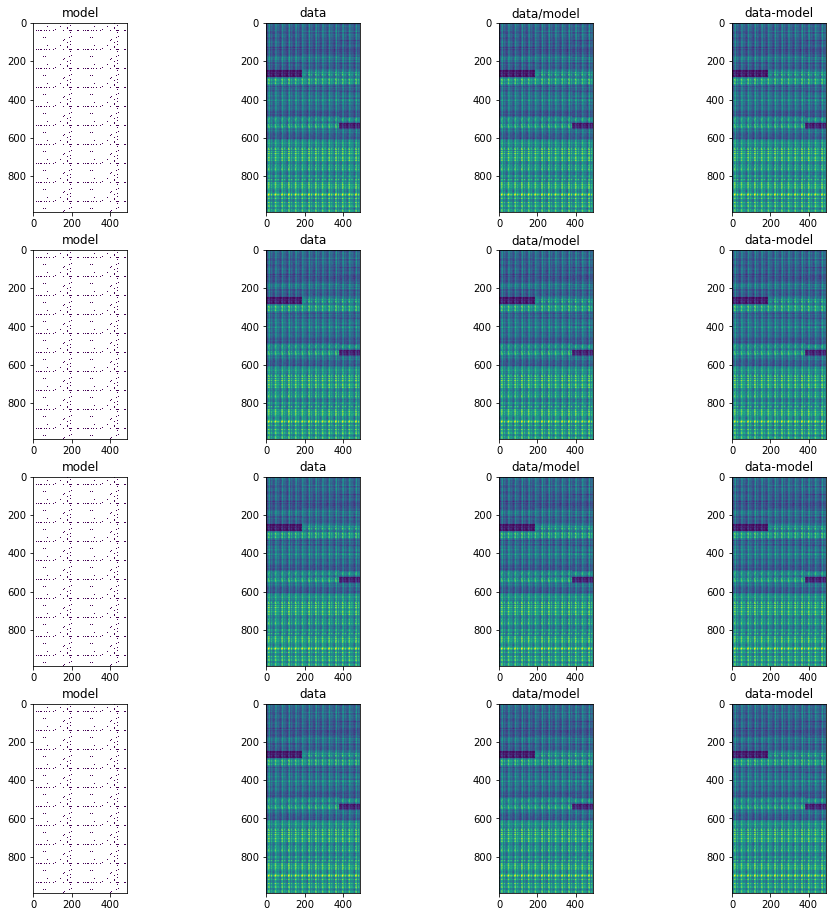

In [23]:
plot_model(data_check)

In [66]:
from ipywidgets import interact
import warnings
warnings.simplefilter('ignore')

def data_explorer(data):
    @interact(spw=(0,data['data'].shape[1]-1))
    def f(spw=0):
        """
        plot baseline-vs-time images for visibility data
        """
        fig = pl.figure(figsize=(12,8))
        ind = 1
        with warnings.catch_warnings():
            warnings.simplefilter('ignore')
            for pol in (0,1):
                mod = np.abs(data['model_data'][pol,spw])
                dat = np.abs(data['data'][pol,spw])
                ax1 = pl.subplot(2,4,ind)
                ax1.imshow(mod, norm=simple_norm(mod, min_percent=1, max_percent=99, stretch='asinh'))
                ax1.set_title("model")
                ax2 = pl.subplot(2,4,ind+1)
                ax2.imshow(dat, norm=simple_norm(dat, min_percent=1, max_percent=99, stretch='asinh'))
                ax2.set_title("data");
                ax3 = pl.subplot(2,4,ind+2)
                try:
                    ax3.imshow(dat/mod, norm=simple_norm(dat/mod, min_percent=1, max_percent=99, stretch='asinh'))
                except:
                    ax3.imshow(dat/mod)
                fig.colorbar(mappable=ax3.images[0])    
                ax3.set_title("data/model")
                ax4 = pl.subplot(2,4,ind+3)
                ax4.imshow(dat-mod, norm=simple_norm(dat-mod, min_percent=1, max_percent=99, stretch='asinh'))
                fig.colorbar(mappable=ax4.images[0])
                ax4.set_title("data-model")
                ind += 4
        pl.subplots_adjust(wspace=0)
        pl.suptitle(f"channel{spw}")
    return f

In [63]:
data_explorer(data_check)

interactive(children=(IntSlider(value=0, description='spw', max=11), Output()), _dom_classes=('widget-interact…

<function __main__.data_explorer.<locals>.f>

In [65]:
%timeit ms.open(original_ms); ms.selectinit(spws[5]); data_check = ms.getdata(['data', 'corrected_data', 'model_data'], ifraxis=True); ms.close()

1 loop, best of 3: 44 s per loop


1560

In [67]:
ms.open(original_ms); ms.selectinit(spws[7]); data_check = ms.getdata(['data', 'corrected_data', 'model_data'], ifraxis=True); ms.close()
data_explorer(data_check)

interactive(children=(IntSlider(value=0, description='spw', max=11), Output()), _dom_classes=('widget-interact…

<function __main__.data_explorer.<locals>.f>

In [70]:
msmd.open(original_ms)

True

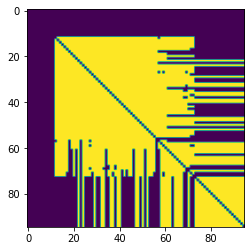

In [74]:
pl.imshow(msmd.baselines())

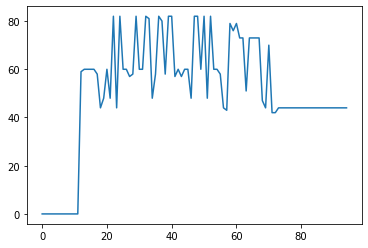

In [79]:
pl.plot(msmd.baselines().sum(axis=0))

In [78]:
msmd.antennaids()[msmd.baselines()[20,:]].

array([12, 13, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29,
       30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46,
       47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63,
       64, 65, 66, 67, 68, 69, 70, 71, 72], dtype=int32)

In [80]:
ms.open(original_ms)

True

In [81]:
ms.selectinit(12)

True

In [88]:
ms.open(original_ms); ms.selectinit(spws[7]); data_check = ms.getdata(['data', 'corrected_data', 'model_data', 'antenna1', 'antenna2', 'time', 'axis_info'], ifraxis=True); ms.close()

True

In [89]:
data_check.keys()

dict_keys(['antenna1', 'antenna2', 'axis_info', 'corrected_data', 'data', 'model_data', 'time'])

In [86]:
ms.getdata?

Signature: ms.getdata(items=[], ifraxis=False, ifraxisgap=0, increment=1, average=False)
Docstring:
This function reads the specified items from the currently
selected measurement set and returns them in fields of a record.
The main difference between this and direct access of the table,
using the table tool, is that this function reads data from the
selected measurement set, provides access to derived
quantities like amplitude and flag_sum, and can reorder the
data.

As with the ms.range function, the items to read are specified
using a vector of strings. Allowable items include: 'amplitude',
'corrected_amplitude', 'model_amplitude', 'ratio_amplitude',
'residual_amplitude', 'obs_residual_amplitude', 'antenna1',
'antenna2', 'axis_info', 'data', 'corrected_data', 'float_data',
'model_data', 'ratio_data', 'residual_data',
'obs_residual_data', 'feed1', 'feed2', 'field_id', 'flag',
'flag_row', 'flag_sum', 'ha' (added to 'axis_info'),
'ifr_number', 'imaginary', 'corrected_imaginary',
'model

In [85]:
md2.close()

True